In [1]:
import cv2
from shapely.geometry import Polygon

from PIL import Image
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision import models
from torch import nn

import pandas as pd
from PIL import ImageEnhance

import torch
from torchvision import models
from torch.nn import CrossEntropyLoss
from torch.nn.functional import softmax
from torch.optim import Adam,lr_scheduler
from torch.nn import functional as F
from torchvision import transforms
from torch.utils.data import Dataset
from utils_d import *

import sys

sys.path.append(r'D:\codes\python\area51m\pytorch_deeplab_xception')

from pytorch_deeplab_xception.modeling import deeplab

os.environ['TORCH_HOME'] = r'\\DESKTOP-lhj25h0\E\ftp\data\MODELS' #setting the environment variable

device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')

In [2]:
os.chdir(r'E:\UCL\Dissertation\label\input_test')

In [3]:
names = os.listdir(r'E:\UCL\Dissertation\label\input')

In [4]:
image_size = (250,400)
number_of_class_firstmodel = 8
number_of_class_secondmodel = 2

transform_deeplab = transforms.Compose([transforms.Resize(image_size),
                                transforms.ToTensor(),
                                transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])

dlab2 = deeplab.DeepLab(num_classes=number_of_class_firstmodel,backbone = 'resnet').to(device)

dlab2.load_state_dict(torch.load(r'E:\UCL\Dissertation\label\trained_models\model_deeplabv3+xception_7.pt'))

_ = dlab2.eval()

for p in dlab2.parameters():
    p.requires_grad = False

dlab2_detail = deeplab.DeepLab(num_classes=number_of_class_secondmodel,backbone = 'resnet').to(device)

dlab2_detail.load_state_dict(torch.load(r'E:\UCL\Dissertation\label\trained_models\model_deeplabv3+resnet.pt'))

for p in dlab2_detail.parameters():
    p.requires_grad = False

_ = dlab2_detail.eval()

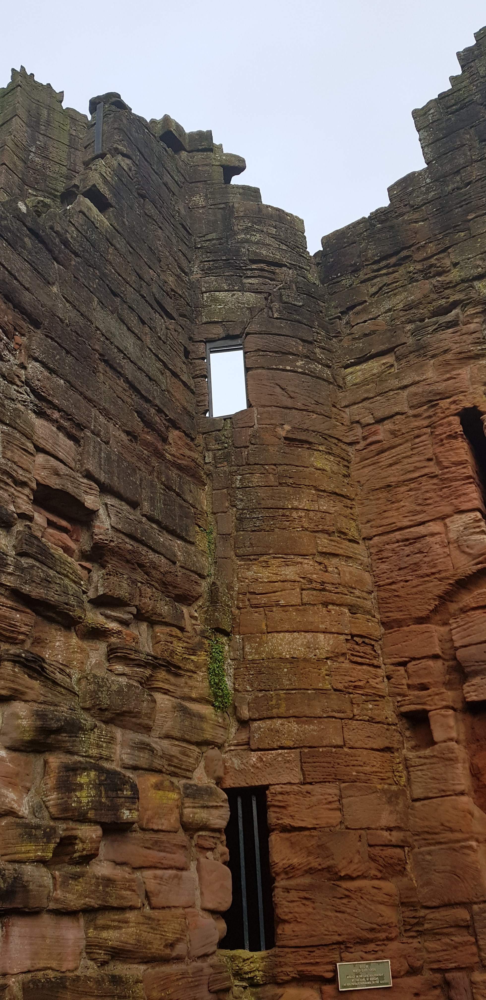

In [5]:
imgname1 = r'20200104_130511.jpg'
img1 = Image.open(imgname1).rotate(-90,expand = True)
img1

In [6]:
distance_list = []
for i in names:
    img2 = Image.open(r'E:\UCL\Dissertation\label\input\{0}'.format(i)).resize(img1.size)
    res = cv2.matchTemplate(np.array(img1),np.array(img2),cv2.TM_CCOEFF_NORMED)
    distance_list.append([i,float(res.squeeze())])
dis_a = np.array(distance_list)

In [24]:
sorted_names = dis_a[dis_a[:,1].argsort()][::-1]
print('the most simillar picture is {0}. the similarity between them is {1}'.format(sorted_names[1][0],sorted_names[1][1]))

the most simillar picture is animage.jpg. the similarity between them is 0.7281712889671326


In [8]:
img2 = Image.open(r'E:\UCL\Dissertation\label\input\{0}'.format(sorted_names[1,0])).resize(img1.size)

In [9]:
validation = transform_deeplab(image_adjust(img1)).unsqueeze(0).to(device)
res= dlab2(validation,interpolate = True).squeeze()

In [11]:
predicted_image1 = predict(image_adjust(img1),transform_deeplab,dlab2,dlab2_detail,3,img1.size,scale = 0.05)
predicted_image2 = predict(image_adjust(img2),transform_deeplab,dlab2,dlab2_detail,3,img1.size,scale = 0.05)

In [12]:
img,area_list,polygon_list,coordinates = find_window(img1,dlab = dlab2,transform_deeplab = transform_deeplab,device = device,area_thres = [0.45,0.55],decay = 0.01)
img_,area_list_,polygon_list_,coordinates_ = find_window(img2,dlab = dlab2,transform_deeplab = transform_deeplab,device = device,area_thres = [0.45,0.55],decay = 0.01)

In [15]:
label1 = Image.open(r'E:\UCL\Dissertation\label\download_test\{0}'.format(imgname1.split('.')[0]+'_plants.png'))#.rotate(-90,expand = True)
label2 = Image.open(r'E:\UCL\Dissertation\label\download\{0}'.format('.'.join(sorted_names[1,0].split('.')[:-1])+'_plants.png')).resize(img1.size)

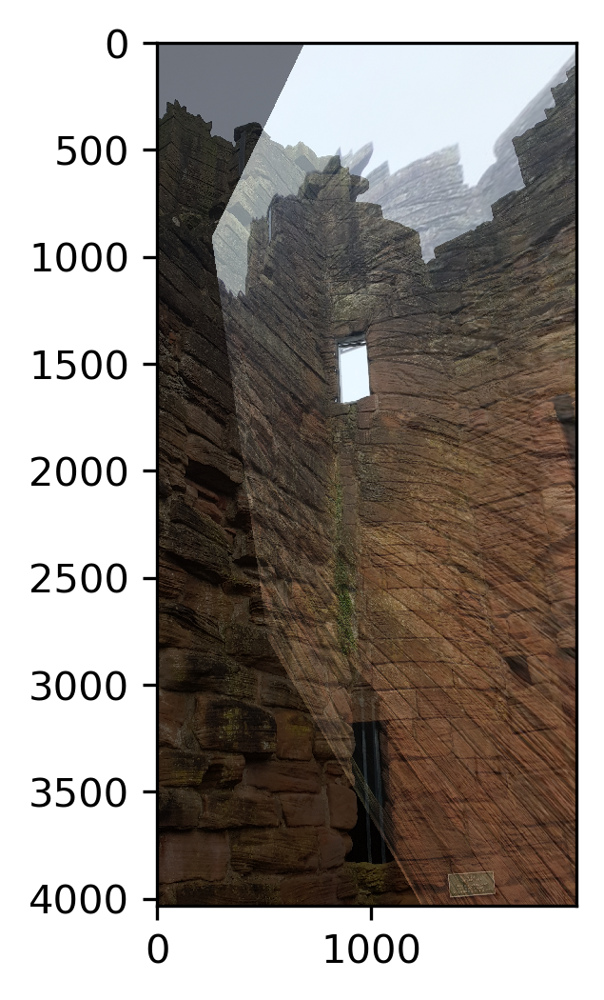

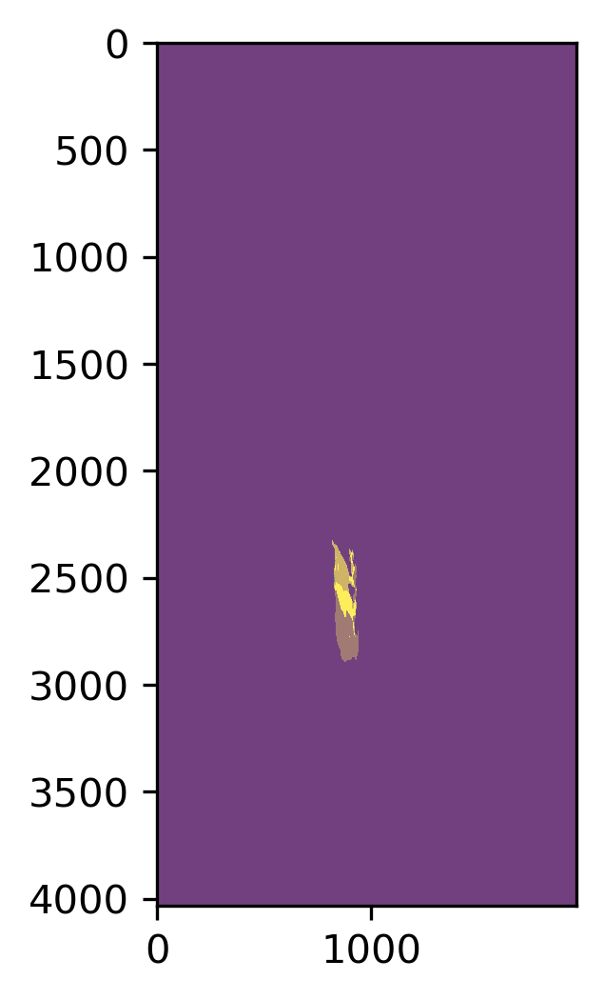

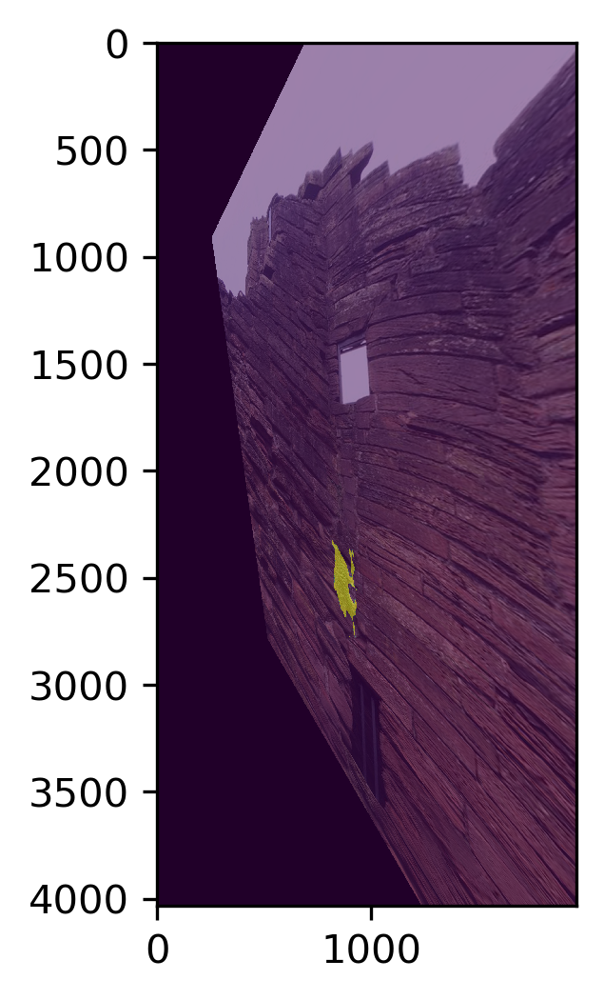

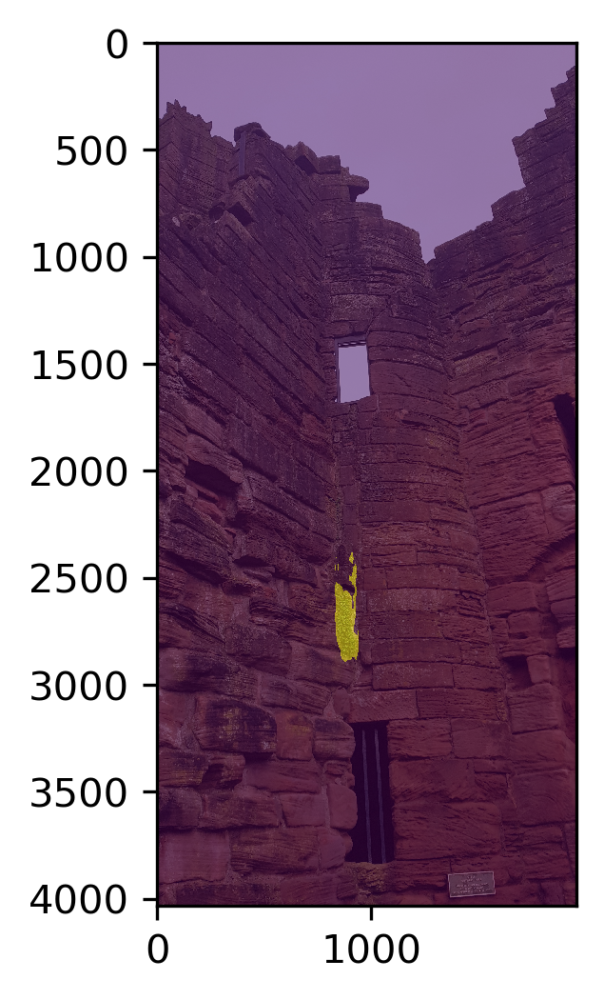

In [16]:
h, mask = cv2.findHomography(adjust_position(outter(polygon_list_[0],out = True),coordinates_[0][0],coordinates_[0][1]),
                             adjust_position(outter(polygon_list[0],out = True),coordinates[0][0],coordinates[0][1]))

warped_original = cv2.warpPerspective(np.array(img2), h, img2.size)
warped_prediction = cv2.warpPerspective(predicted_image2, h, Image.fromarray(predicted_image2).size)

plt.figure(dpi =300)
plt.imshow(np.array(img1))
plt.imshow(warped_original,alpha = 0.5)

plt.figure(dpi =300)
plt.imshow(predicted_image1,alpha = 0.5)
plt.imshow(warped_prediction,alpha = 0.5)

plt.figure(dpi =300)
plt.imshow(warped_original,alpha = 1)
plt.imshow(warped_prediction,alpha = 0.5)

plt.figure(dpi =300)
plt.imshow(np.array(img1),alpha = 1)
plt.imshow(predicted_image1,alpha = 0.5)

In [18]:
cal_area(warped_prediction,predicted_image1)
print('\n')
cal_area(warped_label,np.array(label1))

0.28604075558794945%
0.42077917476514415%
38.12524615990548%


0.23856343132491092%
0.26309928733398125%
9.781813595661506%


(0.002385634313249109, 0.0026309928733398123)

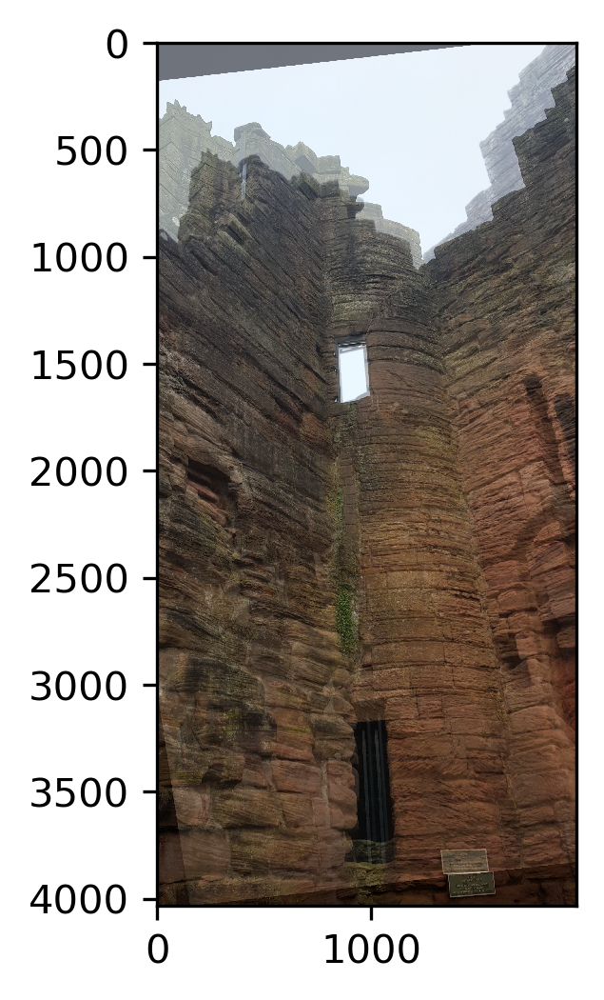

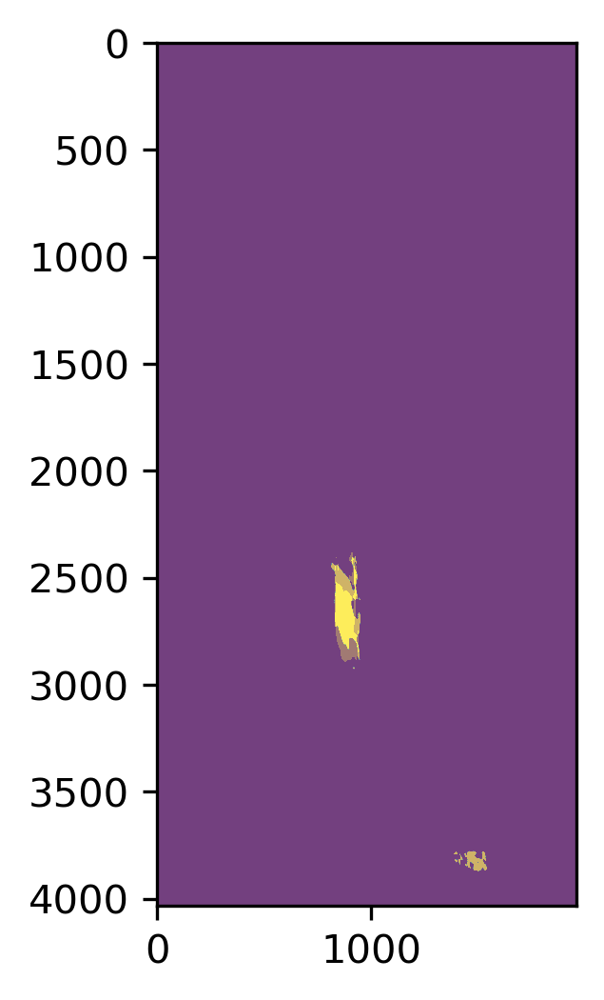

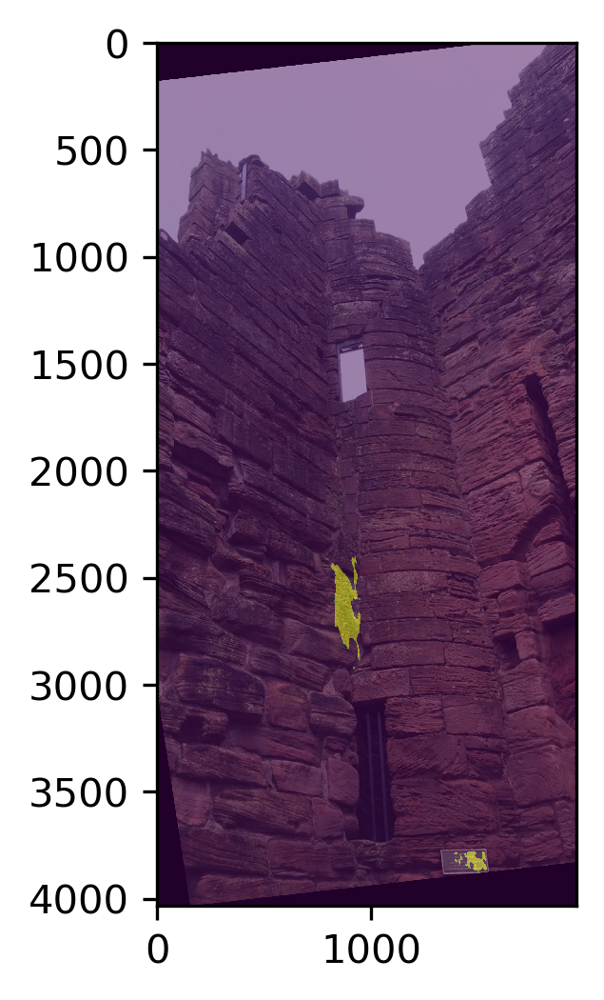

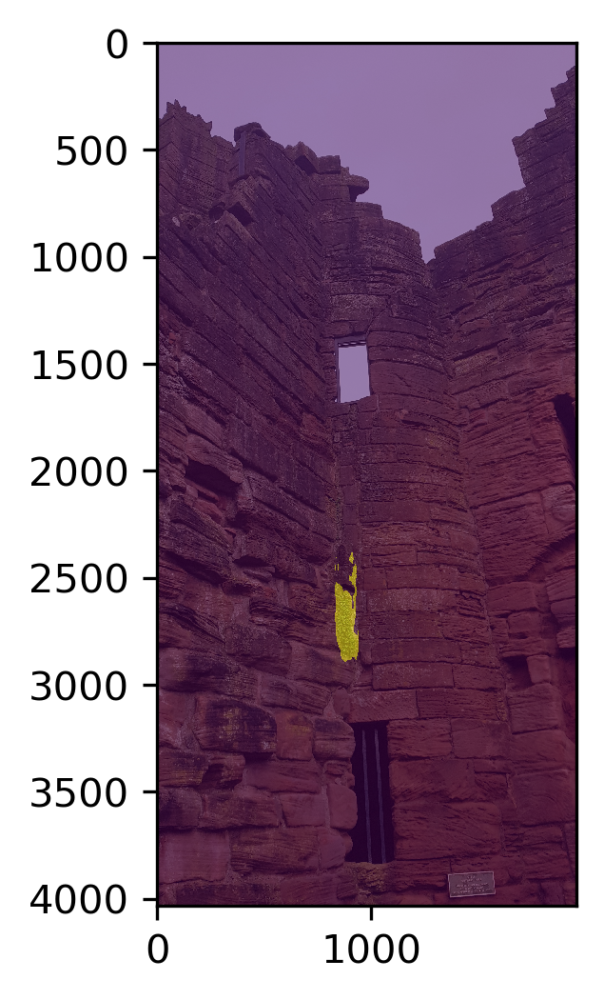

In [19]:
h, mask = cv2.findHomography(adjust_position(outter(polygon_list_[0],out = False),coordinates_[0][0],coordinates_[0][1]),
                             adjust_position(outter(polygon_list[0],out = False),coordinates[0][0],coordinates[0][1]))

warped_original = cv2.warpPerspective(np.array(img2), h, img2.size)
warped_prediction = cv2.warpPerspective(predicted_image2, h, Image.fromarray(predicted_image2).size)

plt.figure(dpi =300)
plt.imshow(np.array(img1))
plt.imshow(warped_original,alpha = 0.5)

plt.figure(dpi =300)
plt.imshow(predicted_image1,alpha = 0.5)
plt.imshow(warped_prediction,alpha = 0.5)

plt.figure(dpi =300)
plt.imshow(warped_original,alpha = 1)
plt.imshow(warped_prediction,alpha = 0.5)

plt.figure(dpi =300)
plt.imshow(np.array(img1),alpha = 1)
plt.imshow(predicted_image1,alpha = 0.5)

In [21]:
cal_area(warped_prediction,predicted_image1)
print('\n')
cal_area(warped_label,np.array(label1))

0.5154048226433431%
0.42077917476514415%
20.21518166089966%


0.34574171930677033%
0.26309928733398125%
27.147459212303847%


(0.0034574171930677033, 0.0026309928733398123)